# Avaliação do resultado do modelo

### Identificação de 1 classe

* 0 - Background
* 1 - uva


In [1]:
## import pacotes

import pandas as pd
import numpy as np
import cv2
import os
import re

from PIL import Image

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

from os import listdir
from os.path import isfile, join
from matplotlib import pyplot as plt
import torchvision.models as models
import warnings
warnings.filterwarnings('ignore')

## Formato dos diretórios

 * img
     * train (imagens de treinamento)
     * test (imagens para teste)
 
 * anotacoes (contém todas as anotações de treinamento e teste em formato .csv)  

In [2]:
## Diretórios 

DIR_INPUT = 'Imagens/img/'

path = 'Imagens/img/train/'
DIR_TRAIN = f'{DIR_INPUT}/train/'
DIR_TEST = f'{DIR_INPUT}/test/'
path_anotacoes = 'Imagens/anotacoes/'

In [3]:
## Verifica tamanho das imagens

onlyfiles = [f for f in listdir(DIR_TRAIN) if isfile(join(DIR_TRAIN, f))]
print('Quantidade de arquivos: ',len(onlyfiles))
print('\n')
      
for i in onlyfiles:
    img = cv2.imread(DIR_TRAIN + i)
    print(img.shape)

Quantidade de arquivos:  293


(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1536, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 2048, 3)
(1365, 20

In [4]:
## Percorre anotações

onlyfiles = [f for f in listdir(path_anotacoes) if isfile(join(path_anotacoes, f))]
print('Quantidade de arquivos: ',len(onlyfiles))

base_imagens = pd.DataFrame()

for i in onlyfiles:
    df = pd.read_csv((path_anotacoes + i),header=None)
    base_imagens = pd.concat([base_imagens,df], axis=0)
    print(df.shape)


Quantidade de arquivos:  2
(122, 8)
(4190, 8)


In [5]:
base_imagens

,0,1,2,3,4,5,6,7
0,uva,142,258,173,310,CDY_2015.jpg,2048,1365
1,uva,1016,650,85,88,CDY_2015.jpg,2048,1365
2,uva,1332,606,79,129,CDY_2015.jpg,2048,1365
3,uva,53,572,213,176,CDY_2015.jpg,2048,1365
4,uva,70,746,101,95,CDY_2015.jpg,2048,1365
...,...,...,...,...,...,...,...,...
4185,uva,386,853,155,224,SYH_2017-04-27_1344.jpg,2048,1365
4186,uva,382,572,169,281,SYH_2017-04-27_1344.jpg,2048,1365
4187,uva,591,755,109,229,SYH_2017-04-27_1344.jpg,2048,1365
4188,uva,703,558,216,276,SYH_2017-04-27_1344.jpg,2048,1365


In [6]:
## Colunas renomeadas para gerar as bounding boxes

base_imagens.rename(columns={0: "label",1:"x",2:"y",3:"w",4:"h", 5: "image_id",6:"width",7:"height"}, inplace=True)
base_imagens

,label,x,y,w,h,image_id,width,height
0,uva,142,258,173,310,CDY_2015.jpg,2048,1365
1,uva,1016,650,85,88,CDY_2015.jpg,2048,1365
2,uva,1332,606,79,129,CDY_2015.jpg,2048,1365
3,uva,53,572,213,176,CDY_2015.jpg,2048,1365
4,uva,70,746,101,95,CDY_2015.jpg,2048,1365
...,...,...,...,...,...,...,...,...
4185,uva,386,853,155,224,SYH_2017-04-27_1344.jpg,2048,1365
4186,uva,382,572,169,281,SYH_2017-04-27_1344.jpg,2048,1365
4187,uva,591,755,109,229,SYH_2017-04-27_1344.jpg,2048,1365
4188,uva,703,558,216,276,SYH_2017-04-27_1344.jpg,2048,1365


### Mudança nomenclatura
1 - uva


In [7]:
base_imagens['label'] = base_imagens['label'].str.lower()
base_imagens.loc[base_imagens['label'] == 'uva','label'] = int(1)

In [8]:
base_imagens

,label,x,y,w,h,image_id,width,height
0,1,142,258,173,310,CDY_2015.jpg,2048,1365
1,1,1016,650,85,88,CDY_2015.jpg,2048,1365
2,1,1332,606,79,129,CDY_2015.jpg,2048,1365
3,1,53,572,213,176,CDY_2015.jpg,2048,1365
4,1,70,746,101,95,CDY_2015.jpg,2048,1365
...,...,...,...,...,...,...,...,...
4185,1,386,853,155,224,SYH_2017-04-27_1344.jpg,2048,1365
4186,1,382,572,169,281,SYH_2017-04-27_1344.jpg,2048,1365
4187,1,591,755,109,229,SYH_2017-04-27_1344.jpg,2048,1365
4188,1,703,558,216,276,SYH_2017-04-27_1344.jpg,2048,1365


In [9]:
## Retira extensão .jpg da coluna Image_id

for linha  in range(len(base_imagens)):

    base_imagens['image_id'].iloc[linha] = base_imagens['image_id'].iloc[linha].replace(".jpg", "")


In [10]:
image_ids = base_imagens['image_id'].unique()

In [11]:
image_ids

array(['CDY_2015', 'CDY_2061', 'CDY_20180427_153433120_BURST001',
       'CFR_20180427_141158495', 'CSV_1902', 'CSV_1911', 'SVB_1932',
       'CDY_2016', 'CDY_2017', 'CDY_2018', 'CDY_2019', 'CDY_2020',
       'CDY_2021', 'CDY_2022', 'CDY_2023', 'CDY_2024', 'CDY_2025',
       'CDY_2026', 'CDY_2027', 'CDY_2028', 'CDY_2029', 'CDY_2030',
       'CDY_2031', 'CDY_2032', 'CDY_2033', 'CDY_2034', 'CDY_2035',
       'CDY_2036', 'CDY_2037', 'CDY_2038', 'CDY_2039', 'CDY_2040',
       'CDY_2041', 'CDY_2042', 'CDY_2043', 'CDY_2044', 'CDY_2045',
       'CDY_2046', 'CDY_2047', 'CDY_2048', 'CDY_2049', 'CDY_2050',
       'CDY_2051', 'CDY_2052', 'CDY_2053', 'CDY_2054', 'CDY_2055',
       'CDY_2056', 'CDY_2057', 'CDY_2058', 'CDY_2059', 'CDY_2060',
       'CDY_2062', 'CDY_2063', 'CDY_2064',
       'CDY_20180427_152724818_BURST000_COVER_TOP',
       'CDY_20180427_152823935_BURST000_COVER_TOP',
       'CDY_20180427_152937457_BURST000_COVER_TOP',
       'CDY_20180427_153021423_BURST001',
       'CDY_20180427_

In [12]:

arquivos_teste = [f for f in listdir(DIR_TEST) if isfile(join(DIR_TEST, f))]

#arquivos_teste
list_imagem_test = []
for imagem_teste  in arquivos_teste:
    #print(imagem_teste)
    list_imagem_test.append(imagem_teste.replace(".jpg", ""))
    
image_ids = list(set(list_imagem_test) & set(image_ids))
print(image_ids)
valid_ids = image_ids
valid_df = base_imagens[base_imagens['image_id'].isin(valid_ids)]
print(valid_df['image_id'].unique())

['CSV_1911', 'CFR_20180427_141158495', 'SVB_1932', 'CDY_2015', 'CDY_2061', 'CDY_20180427_153433120_BURST001']
['CDY_2015' 'CDY_2061' 'CDY_20180427_153433120_BURST001'
 'CFR_20180427_141158495' 'CSV_1911' 'SVB_1932']


In [13]:
base_imagens['label'] = pd.to_numeric(base_imagens['label'])

In [14]:
class TesteDataset(Dataset):
    
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()

        self.image_ids = dataframe['image_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms

    def __getitem__(self, index: int):

        image_id = self.image_ids[index]
        records = self.df[self.df['image_id'] == image_id]
        print( self.image_dir + '/' + image_id+'..jpg')
        image = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0

        boxes = records[['x', 'y', 'w', 'h']].values
        boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
        boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        #obj_ids = records['label'].values ###########################################################
        
        # there is only one class
        
        labels = torch.ones((records.shape[0],), dtype=torch.int64)
        #labels = torch.as_tensor(obj_ids, dtype=torch.int64) ##########################################
        
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)
        
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        # target['masks'] = None
        target['image_id'] = torch.tensor([index])
        target['area'] = area
        target['iscrowd'] = iscrowd

        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)

        return image, target, image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [15]:
# Albumentations
def get_train_transform():
    return A.Compose([
        A.Flip(0.5),
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def get_valid_transform():
    
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})


In [16]:
def collate_fn(batch):
    return tuple(zip(*batch))

valid_dataset = TesteDataset(valid_df, DIR_TEST, get_valid_transform())


valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=3,
    shuffle=False,
    num_workers=2,
    collate_fn=collate_fn
)

## A partir daqui rotina de avaliação do resultado

In [17]:
# função para comparar dois bbox e retorna se estão sobrepostos. 
#se retorno 1 - 100% sobreposto 0 - estão fora da interseção

def bb_intersection_over_union(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # compute the area of intersection rectangle
    interArea = abs(max((xB - xA, 0)) * max((yB - yA), 0))
    if interArea == 0:
        return 0
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = abs((boxA[2] - boxA[0]) * (boxA[3] - boxA[1]))
    boxBArea = abs((boxB[2] - boxB[0]) * (boxB[3] - boxB[1]))

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    # return the intersection over union value
    return iou

# carregando modelo salvo

In [18]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

num_classes = 2  # 1 uva + 1 background

# obtem numero de features do classificador
in_features = model.roi_heads.box_predictor.cls_score.in_features

print(in_features)

# substitui a camada de entrada
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=[0],#featmap_names=['0']
                                                output_size=7,
                                                sampling_ratio=2)                 


model.box_roi_pool=roi_pooler

model.load_state_dict(torch.load('model_53.pt'))

1024


<All keys matched successfully>

In [19]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', '1'
]

In [20]:
#Rotina para verificar se há bbox sobrepostos na predição, ainda não está perfeita, está contando repetições
def verifica_sobrepostos_predicao(boxes22):
    

    index=-1
    index2=-1
    tot_sobreposicao=0

    #percorrendo bbox preditos
    for bbox in boxes22[:-1]:
        index=index+1
        index2=-1
        #comparando cada bbox predito com os outros, para saber está sobreposto
        for bbox2 in boxes22[1:]:
            index2=index2+1
        
            iou=bb_intersection_over_union(bbox, bbox2)
            #print("sobreposição ", index, index2, bbox, bbox2, iou)    

            if (index != index2):
                if iou > 0.9:
                    tot_sobreposicao=tot_sobreposicao+1
    return(tot_sobreposicao)
        

In [21]:
#função que percorre cada bbox preditivo, busca o o bbox com intersecção na anotação
# depois verifica se o label é o mesmo ou diferente, 
# essa função verificar para cada detecção, se identificou a classe correta
def eval_labels(boxes22,boxes42):
    cont = 0
    cont2 = -1
    higher_iou = 0
    aux_cont=-1
    cont_flag=0

    outra_classe=0
    mesma_classe=0

    #percorre bbox preditos
    for bbox in boxes22:
        cont2 = -1
        higher_iou = 0
        
        #para cada bbox predito, busca bbox mais próximo na lista de anotações
        for bbox2 in boxes42:
        
            cont2 = cont2 + 1
            iou=bb_intersection_over_union(bbox, bbox2)
        
            if iou > higher_iou:
                higher_iou = iou
                aux_cont=cont2
    
        if pred_class22[cont] != pred_class42[aux_cont]:
            #print("classe diferente " ,bbox, pred_class22[cont],bbox2,higher_iou,pred_class42[cont2])
            outra_classe=outra_classe+1
        else:
            #print("mesma classe " ,bbox, pred_class22[cont],bbox2,higher_iou,pred_class42[cont2])
            mesma_classe=mesma_classe+1
        cont = cont + 1
    return outra_classe, mesma_classe

In [22]:
# gera dois gráficos para cada arquivo de teste, e salva como figura
def gera_grafico(img_id, sample22, sample42):
    cont=0
    s1=sample22.copy()
    s2=sample42.copy()
    for box in boxes22:
        cv2.rectangle(s1,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (220, 0, 0), 3)

        font = cv2.FONT_HERSHEY_SIMPLEX
        text = str(pred_class22[cont])
        cv2.putText(s1, text, (int(box[0])-20, int(box[1]-20)), font, 1.5, (255,0,0), 2)
        cont = cont + 1

    fig, ax = plt.subplots(1, 1, figsize=(int(s1.shape[1]/100),int(s1.shape[0]/100)))


    ax.set_title('Predição do modelo')

    ax.set_axis_off()
    ax.imshow(s1)
    plt.tight_layout()
    plt.savefig(img_id+'-pred.png', dpi=fig.dpi)
    
    cont=0

    for box in boxes42:
        cv2.rectangle(s2,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (220, 0, 0), 3)
    
        font = cv2.FONT_HERSHEY_SIMPLEX
        text = str(pred_class42[cont])
        cv2.putText(s2, text, (int(box[0])-20, int(box[1]-20)), font, 1.5, (255,0,0), 2)
        cont = cont + 1

        
    fig, ax = plt.subplots(1, 1, figsize=(int(s2.shape[1]/100),int(s2.shape[0]/100)))

    
    ax.set_title('Anotações manuais')
    ax.set_axis_off()
    ax.imshow(s2)
    plt.tight_layout()
    plt.savefig(img_id+'-anotacao.png', dpi=fig.dpi)

2
Imagens/img//test//CDY_2015..jpg
Imagens/img//test//CFR_20180427_141158495..jpg
Imagens/img//test//CDY_2061..jpg
Imagens/img//test//CSV_1911..jpg
Imagens/img//test//CDY_20180427_153433120_BURST001..jpg
Imagens/img//test//SVB_1932..jpg
id da imagem:  CDY_2015


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bbox na predição :  29 bbox na anotação :  24
Total de sobreposição apenas na predição  27
bbox próximos com classes distintas:  0  bbox próximos com classes iguais:  29


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


id da imagem:  CFR_20180427_141158495


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bbox na predição :  28 bbox na anotação :  22
Total de sobreposição apenas na predição  26
bbox próximos com classes distintas:  0  bbox próximos com classes iguais:  28


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


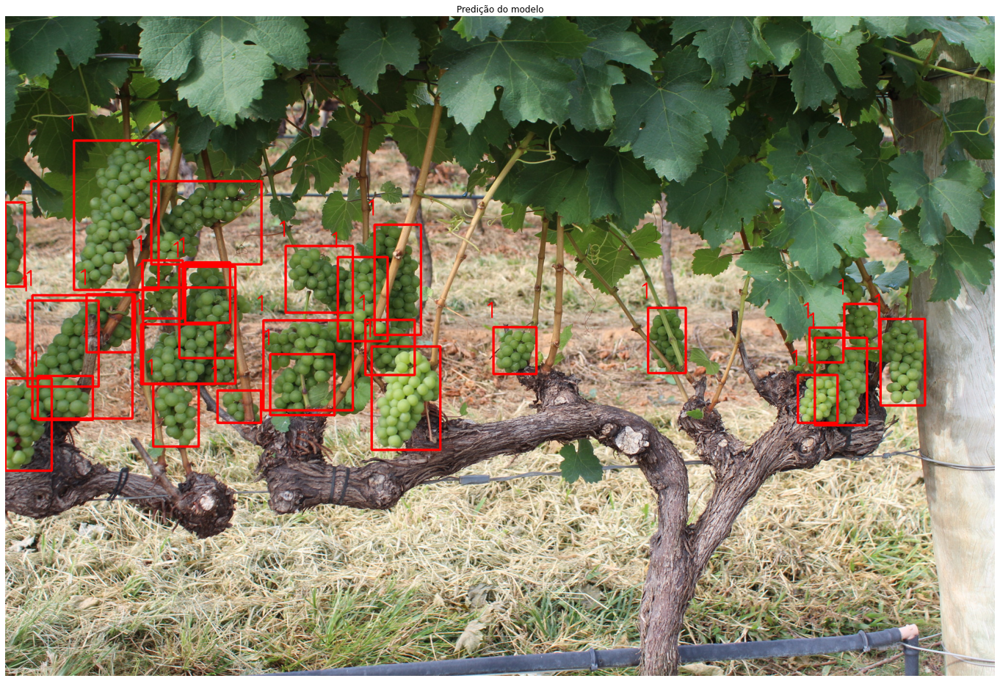

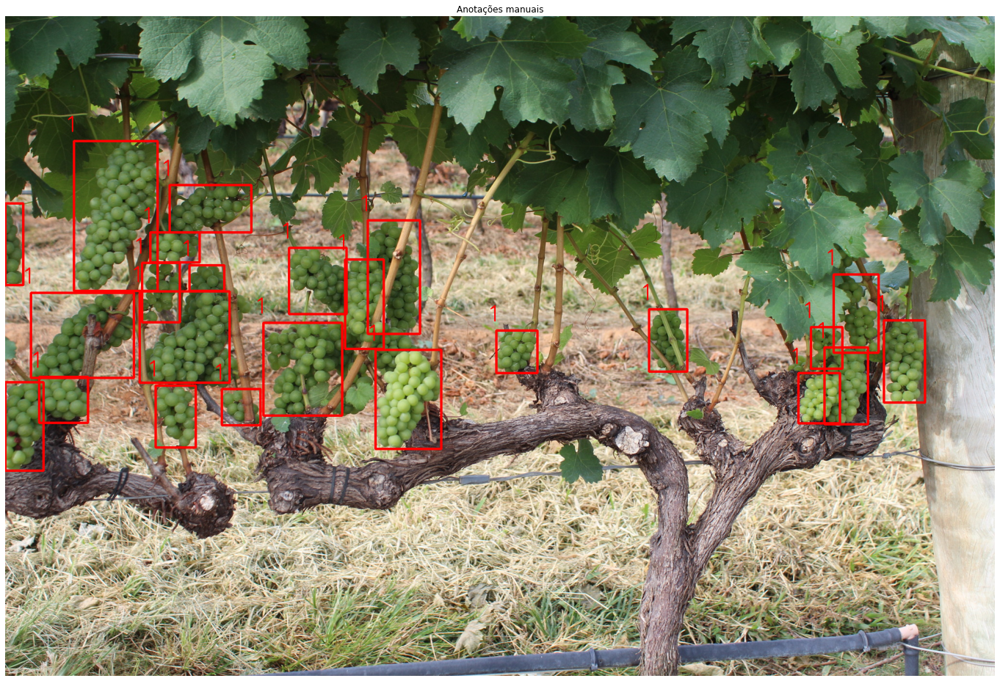

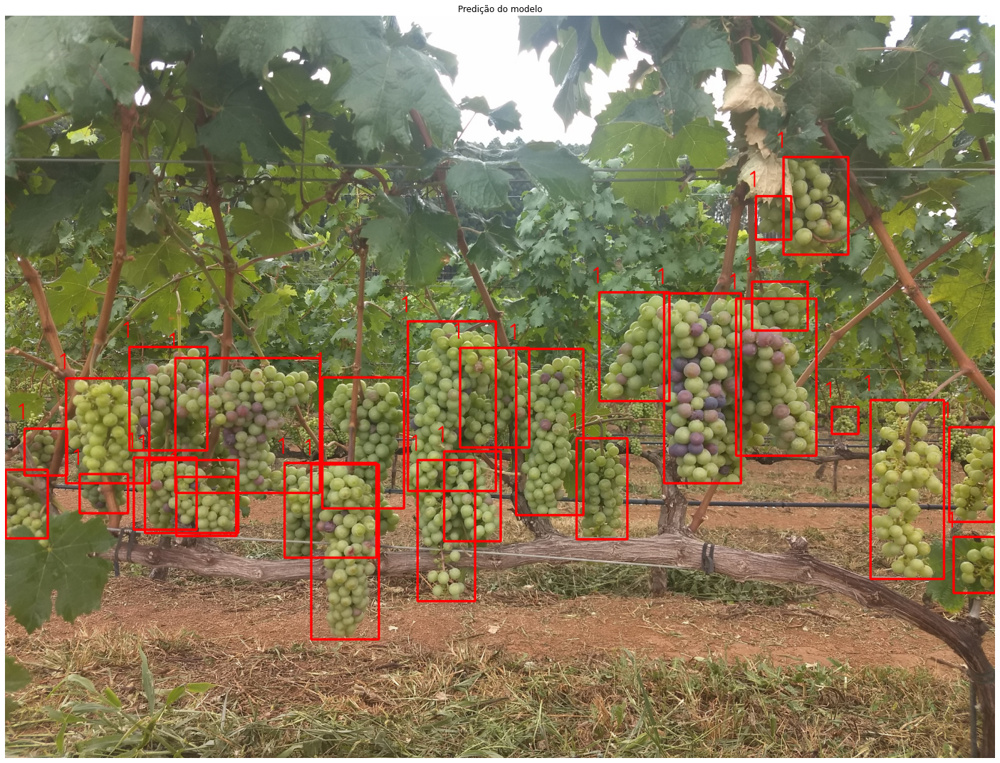

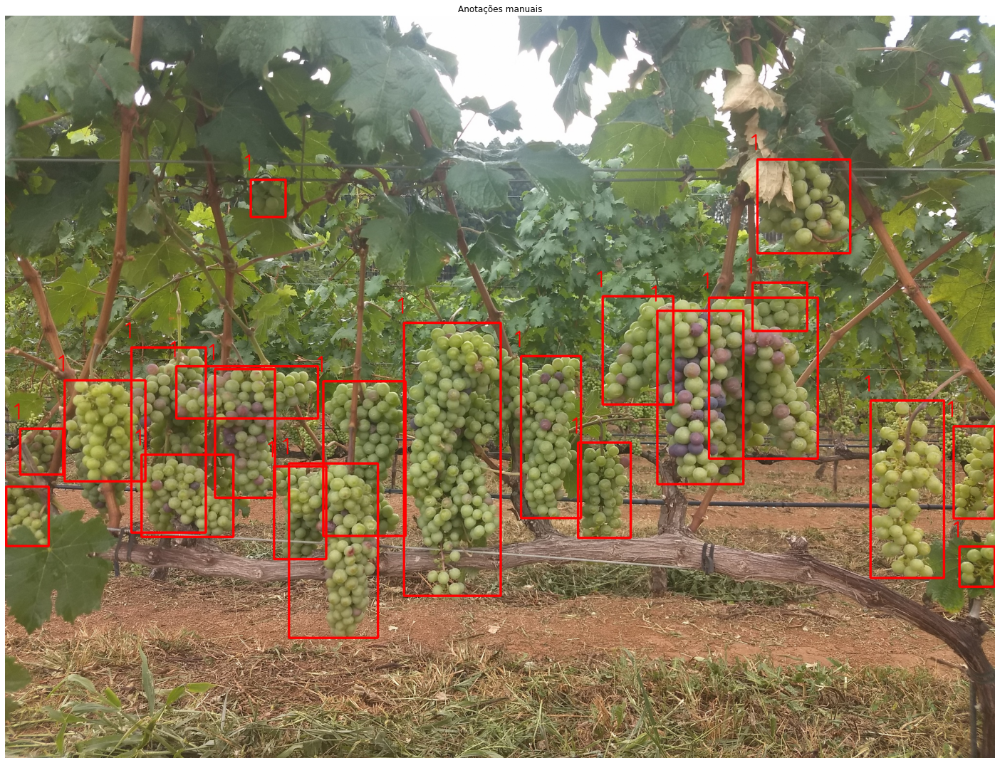

In [23]:
#percorre todos os arquivos da pasta de teste, e verifica quanto acertou na detecção
print(len(valid_data_loader))
model.eval()
device = torch.device("cpu")

for images, targets, image_ids in valid_data_loader:
    print('id da imagem: ', image_ids[0])
    #print(len(images))

    idimg=0
    outputs22 = model(images)
    
    sample22 = images[idimg].permute(1,2,0).cpu().numpy()
    boxes22 =outputs22[0]['boxes'].detach().cpu().numpy().astype(np.int32)
    
    sample42 = images[idimg].permute(1,2,0).cpu().numpy()
    boxes42 = targets[idimg]['boxes'].cpu().numpy().astype(np.int32)
    
    print('bbox na predição : ', len(boxes22), 'bbox na anotação : ',len(boxes42))
    
    tot_sobreposicao = verifica_sobrepostos_predicao(boxes22)
    print("Total de sobreposição apenas na predição ", tot_sobreposicao)

    pred_class22 = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(outputs22[idimg]['labels'].numpy())] 
    pred_class42 = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(targets[idimg]['labels'].numpy())] 

    outra_classe, mesma_classe = eval_labels(boxes22,boxes42)
    print('bbox próximos com classes distintas: ', outra_classe, ' bbox próximos com classes iguais: ', mesma_classe)
    
    gera_grafico(image_ids[0], sample22, sample42)